## Proyecto: Población Mundial
### Métodos Numéricos II
---
**Integrantes:** Abbas, Facundo Jesus - Agüero Trevisan, Martin Gabriel 

#### Lectura de datos

Lectura del dataset provisto y selección de las columnas de datos identificadas como relevantes (según informe). 

In [1]:
import pandas as pd

datosPoblacionales = pd.read_csv('countries-table.csv')
datosPoblacionales = datosPoblacionales[['country','pop1980','pop2000','pop2010','pop2023','pop2024','pop2030','pop2050','growthRate']]
display(datosPoblacionales)

,country,pop1980,pop2000,pop2010,pop2023,pop2024,pop2030,pop2050,growthRate
0,India,687354000,1057920000,1243480000,1438070000,1450940000,1525140000,1679590000,0.0089
1,China,983164000,1269580000,1351560000,1422580000,1419320000,1398150000,1260290000,-0.0023
2,United States,229859000,281484000,311063000,343477000,345427000,355650000,380847000,0.0057
3,Indonesia,148951000,216078000,246305000,281190000,283488000,295877000,320713000,0.0082
4,Pakistan,82291000,154879000,199239000,247504000,251269000,276883000,371864000,0.0152
...,...,...,...,...,...,...,...,...,...
229,Montserrat,11339,5029,4794,4420,4389,4202,3692,-0.0070
230,Falkland Islands,2252,3097,3197,3477,3470,3422,3176,-0.0020
231,Tokelau,1664,1845,1585,2397,2506,2985,3821,0.0455
232,Niue,3533,2047,1768,1817,1819,1835,1966,0.0011


#### Gráficas de datos poblacionales de todos los países

Para un análisis inicial de los datos, se graficarán los datos poblacionales de los distintos países/regiones desde 1980 a 2024, sin incluir las proyecciones, a fines de evaluar el crecimiento/decrecimiento poblacional de cada uno hasta la actualidad. 

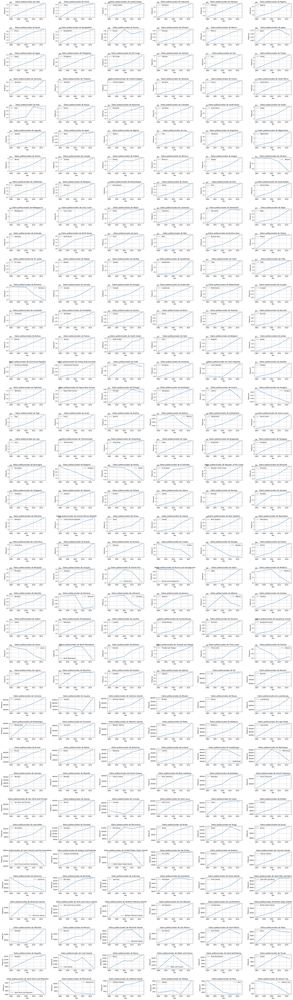

In [6]:
import matplotlib.pyplot as plt
import numpy as np

anios = [1980,2000,2010,2023,2024]

fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

# Se grafican los datos de cada país, desde 1980 a 2024.
for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    axs[i,j].plot(anios, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label=pais)
    axs[i,j].set_title("Datos poblacionales de "+pais)
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_xlabel('Año')
    axs[i,j].set_ylabel('Población')
    j = j+1
    if j == 6:
        j = 0
        i = i+1


#### Evaluación del ajuste de los datos al modelo usando regresión lineal

La ecuación que describe el modelo de Malthus es: 

$$P(t) = P_0 e^{rt} $$

con $r$ tasa de crecimiento, $P_0$ población y $t$ tiempo en años. Para el ajuste de los modelos de regresión lineal, renombraremos las columnas con los datos poblacionales de cada año en base a la diferencia en años entre cada año respectivo y 1980.



In [ ]:
# Renombramos columnas de año a que corresponden datos poblacionales, trabajamos con una copia del dataframe original.
diferenciasEnAniosDesde1980 = [0,20,30,43,44] 
columnasARenombrar = ['pop1980','pop2000','pop2010','pop2023','pop2024']

datosPoblacionalesRenombrados = datosPoblacionales.copy()
renombrarColumnas = dict(zip(columnasARenombrar,diferenciasEnAniosDesde1980))
datosPoblacionalesRenombrados.rename(columns=renombrarColumnas,inplace=True)

display(datosPoblacionalesRenombrados)

,country,0,20,30,43,44,pop2030,pop2050,growthRate
0,India,687354000,1057920000,1243480000,1438070000,1450940000,1525140000,1679590000,0.0089
1,China,983164000,1269580000,1351560000,1422580000,1419320000,1398150000,1260290000,-0.0023
2,United States,229859000,281484000,311063000,343477000,345427000,355650000,380847000,0.0057
3,Indonesia,148951000,216078000,246305000,281190000,283488000,295877000,320713000,0.0082
4,Pakistan,82291000,154879000,199239000,247504000,251269000,276883000,371864000,0.0152
...,...,...,...,...,...,...,...,...,...
229,Montserrat,11339,5029,4794,4420,4389,4202,3692,-0.0070
230,Falkland Islands,2252,3097,3197,3477,3470,3422,3176,-0.0020
231,Tokelau,1664,1845,1585,2397,2506,2985,3821,0.0455
232,Niue,3533,2047,1768,1817,1819,1835,1966,0.0011


Teniendo en cuenta que el modelo de Malthus se puede linealizar de la siguiente forma, resultan como parámetros de la recta de regresión los que se indican a continuación:

$$P(t) = P_0 e^{rt} $$
$$ln(P) = ln(P_0 e^{rt}) $$
$$ln(P) = ln(P_0)+ln(e^{rt}) $$
$$ln(P) = ln(P_0)+rt $$

con parámetros $\begin{cases} b = ln(P_0) \\ m = r \end{cases}$ para la recta $y = mt + b$ con $y=ln(P)$.

Antes de ajustar modelos de regresión para los datos de cada país/región, transformaremos los datos poblacionales teniendo en cuenta la relación resultante de la linearización anterior $y=ln(P)$. Observamos primero, gráficamente, si los datos transformados pueden ajustarse a una recta.




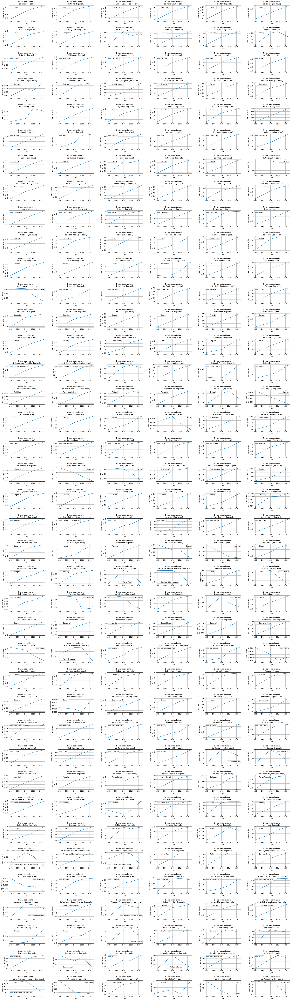

In [ ]:
# Grafico en escala logarítmica (datos transformados)
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    axs[i,j].plot(anios, np.log(datosPais[diferenciasEnAniosDesde1980].values.flatten()), label=pais)
    axs[i,j].set_title("Datos poblacionales \nde "+pais+" (log scale)")
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')
    j = j+1
    if j == 6:
        j = 0
        i = i+1

Podemos observar que para los datos de la mayoría de los países es posible ajustar un recta (aunque no para todos y evaluaremos el ajuste para esos países a fines de evaluar en qué medida se ajustan al modelo de Malthus). Para los datos de cada país, ajustamos modelos de regresión lineal usando la **librería sklearn.linear_model**, **clase LinearRegression** (*documentación disponible en: [LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)*). Al realizar la regresión lineal, obtendremos estimaciones de los parámetros $b$ y $m$ indicados anteriormente. 

In [ ]:
from sklearn.linear_model import LinearRegression

# Se presentan los datos transformados
datosLog = datosPoblacionales.copy()
datosLog[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024', 'pop2030','pop2050']] = np.log(datosLog[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024', 'pop2030','pop2050']])

print("Datos transformados (aplicando logaritmo natural):")
display(datosLog)

# Columnas para dataset con los resultados de cada modelo de regresión
columnas = ['pais', 'regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050', 'm', 'b', 'r2']
regresionPorPais = pd.DataFrame(columns=columnas)

diferenciasAniosParaEstimaciones = diferenciasEnAniosDesde1980 + [50, 70]
resultados = []  

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]

    # Tener en cuenta que para ajustar el modelo se utilizan como abscisas las diferencias en años desde 1980
    regresion = LinearRegression().fit(np.array(diferenciasEnAniosDesde1980).reshape(-1, 1), 
                                       np.log(datosPais[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024']].values.flatten()))
    predicciones = regresion.predict(np.array(diferenciasAniosParaEstimaciones).reshape(-1, 1))

    resultados.append({'pais': pais,
                       'regpop1980': predicciones[0],
                       'regpop2000': predicciones[1],
                       'regpop2010': predicciones[2],
                       'regpop2023': predicciones[3],
                       'regpop2024': predicciones[4],
                       'est2030': predicciones[5],
                       'est2050': predicciones[6],
                       'm': regresion.coef_[0],
                       'b': regresion.intercept_,
                       'r2': regresion.score(np.array(diferenciasEnAniosDesde1980).reshape(-1, 1), 
                                             np.log(datosPais[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024']].values.flatten()))})


regresionPorPais = pd.DataFrame(resultados)
print("Resultados regresión lineal:")
display(regresionPorPais)


Datos transformados (aplicando logaritmo natural):


,country,pop1980,pop2000,pop2010,pop2023,pop2024,pop2030,pop2050,growthRate
0,India,20.348360,20.779571,20.941180,21.086568,21.095477,21.145352,21.241816,0.0089
1,China,20.706287,20.961952,21.024525,21.075738,21.073444,21.058416,20.954608,-0.0023
2,United States,19.252977,19.455586,19.555506,19.654631,19.660292,19.689458,19.757908,0.0057
3,Indonesia,18.819128,19.191150,19.322081,19.454541,19.462680,19.505454,19.586057,0.0082
4,Pakistan,18.225772,18.858155,19.110016,19.326937,19.342035,19.439106,19.734039,0.0152
...,...,...,...,...,...,...,...,...,...
229,Montserrat,9.336003,8.522976,8.475120,8.393895,8.386857,8.343316,8.213924,-0.0070
230,Falkland Islands,7.719574,8.038189,8.069968,8.153925,8.151910,8.137980,8.063378,-0.0020
231,Tokelau,7.416980,7.520235,7.368340,7.781973,7.826443,8.001355,8.248267,0.0455
232,Niue,8.169903,7.624131,7.477604,7.504942,7.506042,7.514800,7.583756,0.0011


Resultados regresión lineal:


,pais,regpop1980,regpop2000,regpop2010,regpop2023,regpop2024,est2030,est2050,m,b,r2
0,India,20.391879,20.726443,20.893724,21.111191,21.127919,21.228288,21.562852,0.016728,20.391879,0.977365
1,China,20.746222,20.908388,20.989471,21.094878,21.102987,21.151636,21.313802,0.008108,20.746222,0.926608
2,United States,19.262330,19.447343,19.539850,19.660109,19.669360,19.724864,19.909877,0.009251,19.262330,0.995519
3,Indonesia,18.855750,19.143463,19.287319,19.474332,19.488717,19.575031,19.862743,0.014386,18.855750,0.979056
4,Pakistan,18.286605,18.787319,19.037676,19.363140,19.388176,19.538390,20.039104,0.025036,18.286605,0.979583
...,...,...,...,...,...,...,...,...,...,...,...
229,Montserrat,9.172012,8.771252,8.570872,8.310377,8.290339,8.170111,7.769350,-0.020038,9.172012,0.824221
230,Falkland Islands,7.769305,7.957194,8.051139,8.173267,8.182662,8.239028,8.426918,0.009394,7.769305,0.916473
231,Tokelau,7.344023,7.518308,7.605451,7.718737,7.727451,7.779737,7.954022,0.008714,7.344023,0.572953
232,Niue,8.050785,7.763003,7.619113,7.432055,7.417666,7.331331,7.043550,-0.014389,8.050785,0.805335


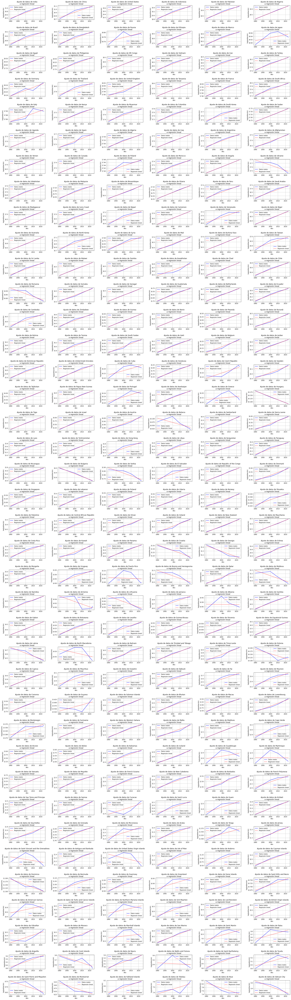

In [16]:
# Graficamos los datos obtenidos junto con los de la regresión lineal para cada país/región
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

for pais in datosPoblacionales['country']:
    
    datosPaisLog = datosLog[datosLog['country'] == pais]
    
    regresion = regresionPorPais[regresionPorPais['pais'] == pais]

    valoresRegresion = regresion[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024']].values.flatten()
    
    axs[i,j].plot(anios, datosPaisLog[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label='Datos reales', color='blue')
    
    axs[i,j].plot(anios, valoresRegresion, label='Regresión lineal', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Ajuste de datos de {pais}\na regresión lineal")
    
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


Analizamos los valores de $R^2$ para evaluar en qué países los datos poblacionales se ajustan mejor al modelo de Malthus. Los siguientes valores y gráficos nos pueden ayudar a determinar qué valores de $R^2$ tendremos en cuenta para evaluar el ajuste.

In [17]:
ajustePorPais = regresionPorPais[['pais','r2']]

print("Análisis de valores de R2:")
display(ajustePorPais['r2'].describe())

Análisis de valores de R2:


count    234.000000
mean       0.885937
std        0.209917
min        0.000273
25%        0.902311
50%        0.973884
75%        0.992271
max        0.999994
Name: r2, dtype: float64

In [18]:
# Análisis de outliers
q1 = ajustePorPais['r2'].quantile(0.25)
q3 = ajustePorPais['r2'].quantile(0.75)
outliers = ajustePorPais[ajustePorPais['r2'] <= q1 - 1.5*(q3-q1)].append( ajustePorPais[ajustePorPais['r2'] >= q3 + 1.5*(q3-q1)])

print("Cantidad de outliers: ",outliers.shape[0])
print("Porcentaje del total: ",(outliers.shape[0]/ajustePorPais.shape[0])*100)
print("Mayor valor de R2 entre los outliers: ",outliers['r2'].max())

Cantidad de outliers:  34
Porcentaje del total:  14.529914529914532
Mayor valor de R2 entre los outliers:  0.7509518108246037


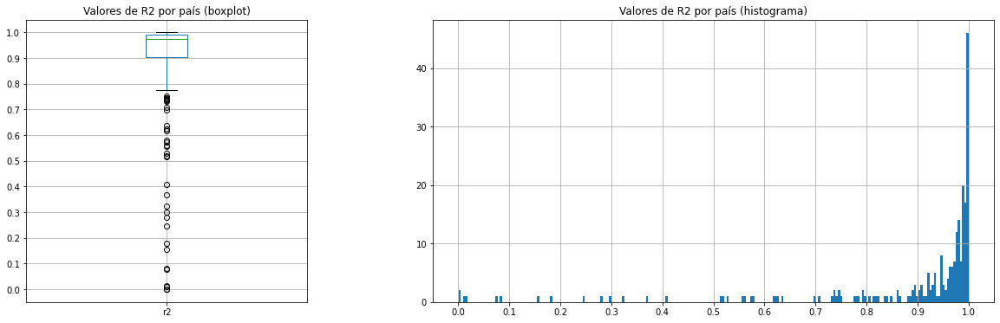

In [19]:
fig, ax = plt.subplots(1,2,figsize=(20,6),gridspec_kw={'width_ratios': [1,2]},facecolor='white')

# Gráfico de caja para visualizar la distribución de los valores de R2
ajustePorPais.boxplot(column='r2',ax=ax[0])

# Histograma como otra forma de visualizar la distribución de los valores de R2
ajustePorPais.hist(column='r2',ax=ax[1],bins=ajustePorPais.shape[0])

ax[0].set_title('Valores de R2 por país (boxplot)')
ax[0].set_yticks(np.arange(0,1.1,0.1))
ax[1].set_title('Valores de R2 por país (histograma)')
ax[1].set_xticks(np.arange(0,1.1,0.1))

plt.show()

El gráfico de caja es otra forma de visualizar los datos obtenidos arriba (cuartiles, rango intercuartil, outliers), y junto con el histograma nos permiten ver la distribución de los valores de $R^2$. A simple vista, los valores de $R^2$ están concentrados entre aproximadamente 0.95 y 1. Los outliers representan el 14,5% del total, hacia valores menores de $R^2$ (lo que indica que la tendencia es hacia un mejor ajuste al modelo que hacia un peor ajuste). En base a lo anterior, podemos decir que *la mayoría de los países se ajustan al modelo de Malthus*. 

Observando los gráficos en donde comparamos los datos del dataset con los de los modelos de regresión, y teniendo en cuenta la cantidad de outliers encontrada, consideramos que no es suficiente considerar a todos los países para los cuales $R^2 < 0.95$ como países con mal ajuste al modelo de Malthus. Por lo tanto, definimos los siguientes rangos de valores:

- Países con muy buen ajuste: $R^2 \geq 0.95$
- Países con buen ajuste: $ Q1 - 1.5*(Q3-Q1) < R^2 < 0.95$ (entre 0.95 y el mayor valor de $R^2$ dentro de los outliers)
- Países con mal ajuste (outliers): $R^2 \leq Q1 - 1.5*(Q3-Q1)$

Veamos la cantidad de países dentro de cada categoría:

In [ ]:
paisesConMuyBuenAjuste = ajustePorPais[ajustePorPais['r2'] >= 0.95]
paisesConBuenAjuste = ajustePorPais.query('r2 < 0.95 & r2 > @q1 - 1.5*(@q3-@q1)')

print("Paises con muy buen ajuste (R2 >= 0.95): ",paisesConMuyBuenAjuste.shape[0])
print("Paises con buen ajuste (R2 < 0.95 y no outliers): ",paisesConBuenAjuste.shape[0])
print("Paises con mal ajuste (outliers): ",outliers.shape[0])

Paises con muy buen ajuste (R2 >= 0.95):  142
Paises con buen ajuste (R2 < 0.95 y no outliers):  58
Paises con mal ajuste (outliers):  34


Ahora, ordenamos los países por $R^2$ y graficamos nuevamente los datos originales junto con los del dataset. De esta manera podemos observar gráficamente la diferencia entre los países de cada categoría por ajuste.

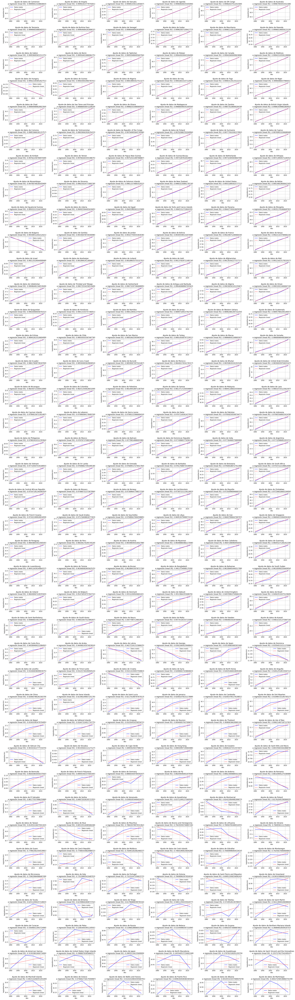

In [30]:
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

regresionPorPais.sort_values(by='r2',ascending=False,inplace=True)

for pais in regresionPorPais['pais']:
        
    datosPaisLog = datosLog[datosLog['country'] == pais]
    regresion = regresionPorPais[regresionPorPais['pais'] == pais]
    valoresRegresion = regresion[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024']].values.flatten()
    
    axs[i,j].plot(anios, datosPaisLog[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label='Datos reales', color='blue')
    
    axs[i,j].plot(anios, valoresRegresion, label='Regresión lineal', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Ajuste de datos de {pais}\na regresión lineal (R2: {regresion['r2'].values[0]})")
    
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


#### Observaciones y conclusiones sobre el ajuste de los datos poblacionales al modelo de Malthus

Para concluir sobre el ajuste de los datos poblacionales al modelo de Malthus tendremos en cuenta dos aspectos:

- Valor del coeficiente de determinación de la regresión para cada país.

- Clasificación de las Naciones Unidas de países por economía (economías desarrolladas, en transición y en desarrollo) citada en informe. 

En cuanto al coeficiente de determinación, dentro de los países que tienen un muy buen ajuste al modelo de Malthus se encuentran Camerún, Senegal, Finlandia, Países Bajos, Colombia, Argentina, entre otros. **Camerún es el país con el mejor ajuste a dicho modelo**. Por otro lado, dentro de los países con un *buen* ajuste, identificamos ejemplos como China, Venezuela, Alemania y Ucrania. Finalmente, los países que no se ajustan al modelo de Malthus son los outliers. Ejemplos son Portugal, Italia, Grecia, Rusia, Cuba y algunos países insulares o de poca superficie. 

De acuerdo con la clasificación de las Naciones Unidas, los países se pueden categorizar en tres tipos según su economía: desarrollados, en transición, o en desarrollo. En base a los ajustes realizados y a dicha clasificación, podemos hacer las siguientes observaciones:

- Gran parte de los países que se ajustan muy bien al modelo de Malthus corresponden a economías en desarrollo, principalmente de África, y en parte de América Latina y Asia (por ejemplo: Camerún, Uganda, Angola, Argentina, India, Paraguay, Perú, Singapur). No obstante, es importante ver que también hay países como Francia, Países Bajos, Nueva Zelanda (economías desarrolladas) que mantienen también un muy buen ajuste al modelo.

- De los países que tienen un ajuste relativamente bueno ($Q1 - 1.5*(Q3-Q1) < R^2 < 0.95$), podemos encontrar tanto países en desarrollo de, en su mayoría, Asia y América Latina como economías en transición (Serbia, Kazajistán, Montserrat, Bosnia y Herzegovina, entre otros) en su mayoría europeas. También algunas economías desarrolladas como Alemania, España y Suecia.

- Los países que no se ajustan bien al modelo de Malthus abarcan distintas regiones geográficas y economías pero suelen ser países insulares (de Europa o el Caribe, con economías mayoritariamente en desarrollo) y algunas economías en transición (Rusia, Armenia, Albania) y desarrolladas (por ejemplo, Portugal, Italia, Grecia, Japón).

*Aclaración*: observamos que la economía es un factor correlacionado con el crecimiento poblacional, pero no es el único. Sin embargo, consideramos que explica bien la adecuación de las poblacionales de cada país al modelo.

En general, no suele ocurrir que países en la misma región tengan un comportamiento similar. Podemos ver que hay países del mismo continente o región que tienen economías diferentes y aún así no se ajustan en la misma medida al modelo de Malthus. Los únicos dos casos en donde hay los países exhiben un comportamiento similar son algunas regiones de África y en menor medida América del Sur. 

---
#### Evaluación de las predicciones obtenidas por regresión lineal contra los datos brindados

En esta instancia transformaremos los datos obtenidos por regresión para compararlos con los datos poblacionales del dataset. Tendremos en cuenta que, de la transformación realizada sobre los datos originales para aplicar regresión lineal, se obtiene que $y=ln(P)\Rightarrow P =e^y$, que es la función a aplicar sobre los resultados de regresión.


In [31]:
# Transformamos los datos de regresión para compararlos con los del dataset en la escala "original"
regresionPorPaisEscOriginal = regresionPorPais.copy()
regresionPorPaisEscOriginal[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050']]=regresionPorPaisEscOriginal[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050']].apply(np.exp,axis=1)
display(regresionPorPaisEscOriginal)


,pais,regpop1980,regpop2000,regpop2010,regpop2023,regpop2024,est2030,est2050,m,b,r2
51,Cameroon,8.513637e+06,1.489446e+07,1.970060e+07,2.833809e+07,2.914178e+07,3.446584e+07,6.029738e+07,0.027966,15.957180,0.999994
40,Angola,8.102676e+06,1.634469e+07,2.321404e+07,3.663000e+07,3.793799e+07,4.682727e+07,9.445978e+07,0.035085,15.907705,0.999924
180,Vanuatu,1.159845e+05,1.862904e+05,2.360943e+05,3.212546e+05,3.289568e+05,3.792066e+05,6.090687e+05,0.023692,11.661212,0.999853
30,Uganda,1.319718e+07,2.414874e+07,3.266639e+07,4.838042e+07,4.986437e+07,5.977427e+07,1.093774e+08,0.030211,16.395514,0.999846
14,DR Congo,2.661141e+07,5.046497e+07,6.949460e+07,1.053417e+08,1.087669e+08,1.317872e+08,2.499168e+08,0.031997,17.096851,0.999826
...,...,...,...,...,...,...,...,...,...,...,...
94,Greece,1.011697e+07,1.029168e+07,1.038016e+07,1.049632e+07,1.050531e+07,1.055941e+07,1.074176e+07,0.000856,16.129725,0.076663
225,Wallis and Futuna,1.253992e+04,1.233775e+04,1.223789e+04,1.210928e+04,1.209945e+04,1.204059e+04,1.184647e+04,-0.000813,9.436673,0.014101
134,Puerto Rico,3.477405e+06,3.446256e+06,3.430786e+06,3.410780e+06,3.409245e+06,3.400055e+06,3.369599e+06,-0.000450,15.061797,0.009630
142,Albania,2.890961e+06,2.885003e+06,2.882029e+06,2.878167e+06,2.877870e+06,2.876090e+06,2.870163e+06,-0.000103,14.877100,0.001053


Ahora graficaremos los datos de cada pais de la base de datos vs los obtenidos con el ajuste en la escala original, *incluyendo las estimaciones de la base de datos y las obtenidas mediante regresión*.

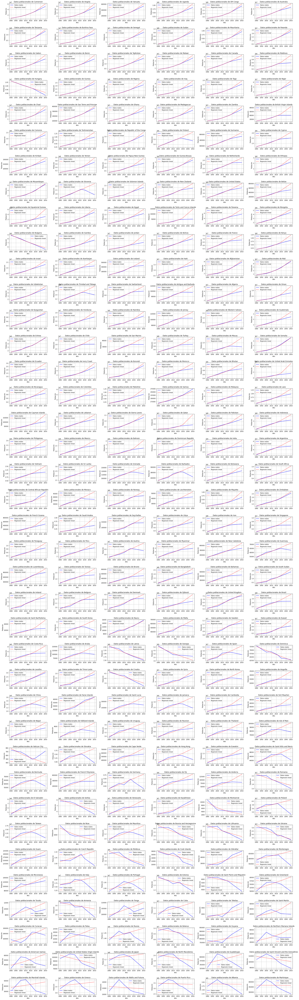

In [36]:
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=5.0)

i = 0
j = 0

aniosConEstimaciones = anios + [2030, 2050]

for pais in regresionPorPaisEscOriginal['pais']:
    
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    
    predicciones = regresionPorPaisEscOriginal[regresionPorPaisEscOriginal['pais'] == pais]

    predicciones_vals = predicciones[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050']].values.flatten()
    
    axs[i,j].plot(aniosConEstimaciones, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024','pop2030','pop2050']].values.flatten(), label='Datos reales', color='blue')
    
    axs[i,j].plot(aniosConEstimaciones, predicciones_vals, label='Regresión lineal', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Datos poblacionales de {pais}")
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('Población')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


Ahora, analicemos los errores entre los valores predichos mediante regresión lineal y los del set de datos para 2050.  

In [35]:
comparacionPaises = regresionPorPaisEscOriginal[['pais','r2','est2050']].copy().sort_index() # ordenamos por países para luego agregar las estimaciones del set de datos
comparacionPaises['pop2050'] = datosPoblacionales['pop2050']
comparacionPaises['errorGlobal'] = abs(comparacionPaises['pop2050'] - comparacionPaises['est2050'])
display(comparacionPaises)


,pais,r2,est2050,pop2050,errorGlobal
0,India,0.977365,2.315408e+09,1679590000,6.358184e+08
1,China,0.926608,1.804956e+09,1260290000,5.446660e+08
2,United States,0.995519,4.433531e+08,380847000,6.250614e+07
3,Indonesia,0.979056,4.229410e+08,320713000,1.022280e+08
4,Pakistan,0.979583,5.045129e+08,371864000,1.326489e+08
...,...,...,...,...,...
229,Montserrat,0.824221,2.366933e+03,3692,1.325067e+03
230,Falkland Islands,0.916473,4.568398e+03,3176,1.392398e+03
231,Tokelau,0.572953,2.847003e+03,3821,9.739968e+02
232,Niue,0.805335,1.145447e+03,1966,8.205534e+02


Observemos los dos siguientes casos: Ucrania y Países Bajos. Tomamos como ejemplo estos dos países ya que sus poblaciones son de tamaño similar y por lo tanto son visiblemente comparables. Podemos ver que Ucrania tiene un ajuste relativamente peor al de Países Bajos (basándonos en el valor de $R^2$), pero el error global en la predicción para la población de 2050 es menor en el caso de Ucrania que en el caso de Países Bajos. 

In [ ]:
display(comparacionPaises.query('pais == "Ukraine" | pais == "Netherlands"'))

,pais,r2,est2050,pop2050,errorGlobal
41,Ukraine,0.784958,3.284971e+07,31990100,8.596136e+05
70,Netherlands,0.997324,2.110776e+07,18958500,2.149261e+06


Queremos analizar también los errores, en general, sobre las prediccciones para 2050. Sin embargo, los países tienen poblaciones de diferentes escalas, por lo que necesitamos reescalar los errores para compararlos. Lo que haremos es obtener qué porcentaje del total de la población estimada de 2050 (del set de datos) representa el error global calculado.

,pais,r2,est2050,pop2050,errorGlobal,errorPorcentual
0,India,0.977365,2.315408e+09,1679590000,6.358184e+08,37.855572
1,China,0.926608,1.804956e+09,1260290000,5.446660e+08,43.217512
2,United States,0.995519,4.433531e+08,380847000,6.250614e+07,16.412402
3,Indonesia,0.979056,4.229410e+08,320713000,1.022280e+08,31.875239
4,Pakistan,0.979583,5.045129e+08,371864000,1.326489e+08,35.671351
...,...,...,...,...,...,...
229,Montserrat,0.824221,2.366933e+03,3692,1.325067e+03,35.890216
230,Falkland Islands,0.916473,4.568398e+03,3176,1.392398e+03,43.841254
231,Tokelau,0.572953,2.847003e+03,3821,9.739968e+02,25.490626
232,Niue,0.805335,1.145447e+03,1966,8.205534e+02,41.737200


count    234.000000
mean      33.622320
std       33.292447
min        0.004537
25%       15.462370
50%       26.442516
75%       37.482952
max      243.869805
Name: errorPorcentual, dtype: float64

Cantidad de outliers:  22


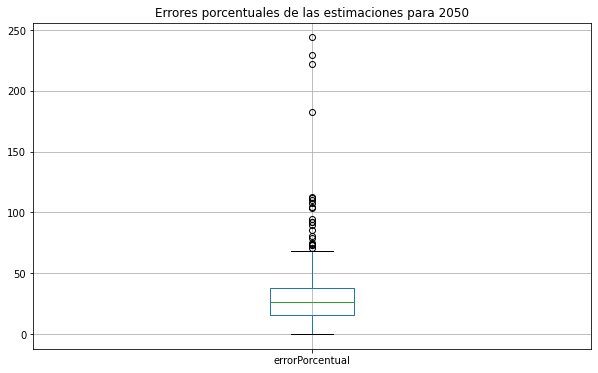

In [37]:
comparacionPaises['errorPorcentual'] = (comparacionPaises['errorGlobal'] / comparacionPaises['pop2050']) * 100
display(comparacionPaises)

display(comparacionPaises['errorPorcentual'].describe())
q1 = comparacionPaises['errorPorcentual'].quantile(0.25)
q3 = comparacionPaises['errorPorcentual'].quantile(0.75)
outliers = comparacionPaises[comparacionPaises['errorPorcentual'] < q1 - 1.5*(q3-q1)].append(comparacionPaises[comparacionPaises['errorPorcentual'] > q3 + 1.5*(q3-q1)])

print("Cantidad de outliers: ",outliers.shape[0])

fig, ax = plt.subplots(1,1,figsize=(10,6),facecolor='white')
ax.set_title('Errores porcentuales de las estimaciones para 2050')
comparacionPaises.boxplot(column='errorPorcentual',ax=ax)
plt.show()

#### Conclusiones sobre las predicciones por regresión y sobre las predicciones de los datos originales

*Conclusiones en general para las proyecciones a 2050*

En base al ejemplo anterior, podemos concluir que un buen ajuste de los datos al modelo de Malthus (o bien, a la recta de regresión correspondiente) no implica que las predicciones que se puedan obtener por el método de regresión lineal sean igual de buenas o en todo caso mejores que las que se pueden obtener para datos que no sea ajustan tan bien al modelo. *Para este análisis entenderemos como "predicciones buenas" a las que se acercan a las del dataset*.

Lo anterior se debe a que las predicciones por el modelo dependen, en gran medida, del valor de la tasa de crecimiento poblacional, y por lo tanto, suponen que el comportamiento de la población se mantendrá (en crecimiento o decrecimiento exponencial). No tienen en cuenta otros parámetros que pueden llegar a influir a futuro en el dicho comportamiento exponencial. Cabe destacar además que se cuenta con pocas muestras (5 años de un intervalo de 44 años, desde 1980 hasta 2024) para hacer predicciones casi 20 años hacia adelante (hasta 2050), lo cual influye negativamente en la precisión de las predicciones.

Por lo tanto, en aquellos países en donde los datos poblacionales se ajusten al modelo de Malthus y hacia 2050 se mantenga la tendencia de crecimiento/decrecimiento exponencial (y esto se vea reflejado en el modelo utilizado para las predicciones del dataset), las predicciones serán cercanas a las del dataset. Si el modelo utilizado en el dataset determina que la dinámica poblacional para dichos países cambiará hacia 2050, entonces el modelo de Malthus puede no dar predicciones cercanas a las del dataset. 

En el caso de los países cuyos datos no se ajustan al modelo de Malthus, entonces no se puede concluir con certeza qué tan próximas o no serán las proyecciones mediante dicho modelo a las del dataset.

Del análisis anterior de los errores, se debe notar que el hecho de que haya pocos outliers no quiere decir que el resto de los errores porcentuales sean "aceptables" o "buenos" de por sí. La distrbución nos indica que los errores se concentran hacia valores 15% y 37%, y que relativamente son pocos los de mayor magnitud. Si consideramos que un error porcentual de aproximadamente el 20% es aceptable, entonces podemos decir que las predicciones que obtenemos son, en general, aceptables, con algunas pocas excepciones. Ahora, si se busca un error porcentual menor, entonces las predicciones no serían buenas. Es importante tener en cuenta que varias poblaciones siguen un crecimiento exponencial y se está buscando predecir 26 años hacia adelante, lo cual es un período relativamente grande para los datos poblacionales que tenemos (nuestro set de datos solo contiene datos de 5 de los 44 años de diferencia entre 1980 y 2024).

Volviendo a la clasificación de los países por nivel de desarrollo económico, solo podría hacerse un breve comentario: en el caso de los países en desarrollo para los cuales el ajuste es bueno, se observa que en varios de ellos las predicciones también se pueden considerar buenas, porque sería esperable que el crecimiento poblacional de países en desarrollo mantenga el mismo ritmo de crecimiento exponencial acompañando al crecimiento de la economía. Sin embargo, esto no es una regla general. Por otro lado, hay casos de países desarrollados como Francia y Finlandia en donde el ajuste es bueno pero las predicciones no tanto, ya que es más probable que en países desarrollados el crecimiento poblacional se desacelere o cambie de comportamiento (a uno no exponencial).